Parameters to set:

up, down, left, right


## Images

In [1]:
import heapq
import os
import sys
import numpy as np
import pandas as pd
from skimage import io, img_as_float32
import matplotlib.pyplot as plt
import seaborn as sns
from skimage.segmentation import find_boundaries
from scipy import ndimage
from skimage import exposure
from skimage import color
from skimage import filters
%matplotlib inline
%load_ext autoreload
%autoreload 2
import os, sys
sys.path.append("../bardensr")
import bardensr
import bardensr.plotting
from DeCRISP import decrisp as dcp

In [2]:
# Read in the membrane segmentation
with open('./data/20210928Xenograft_masks_mem_reg.npy', 'rb') as m:
    masks_mem = np.load(m)

In [3]:
n_channels = 2
n_cycles = 5

In [5]:
with open('./data/20210928Xenograft_reg.npy', 'rb') as f:
    X = np.load(f)

In [6]:
X.shape

(10, 1, 1410, 1000)

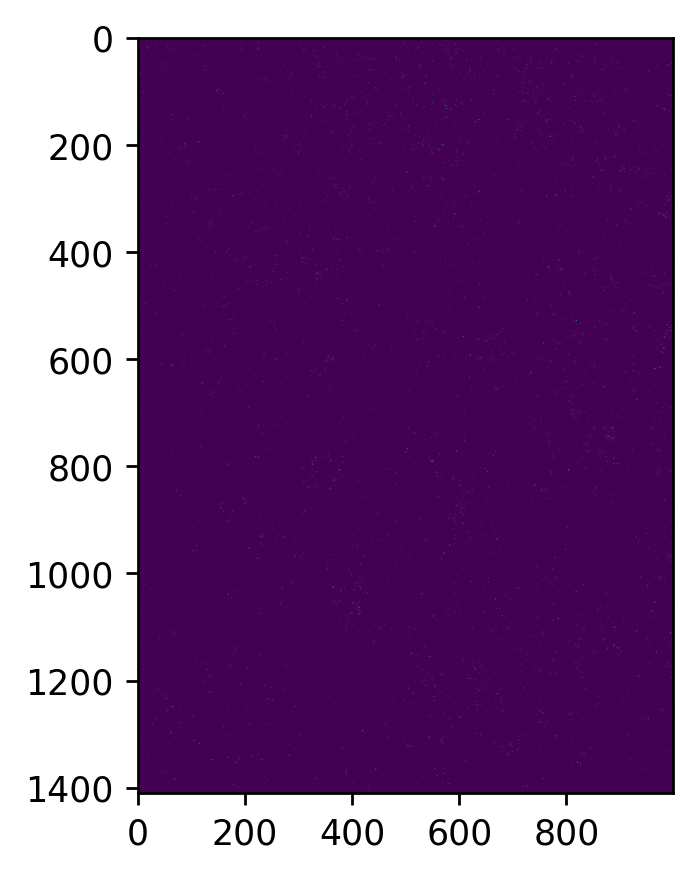

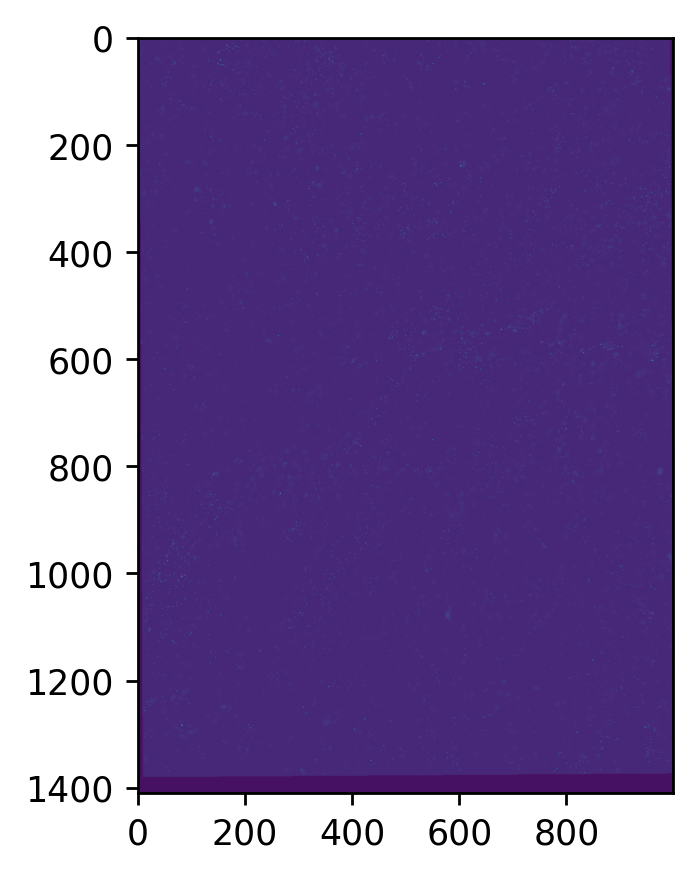

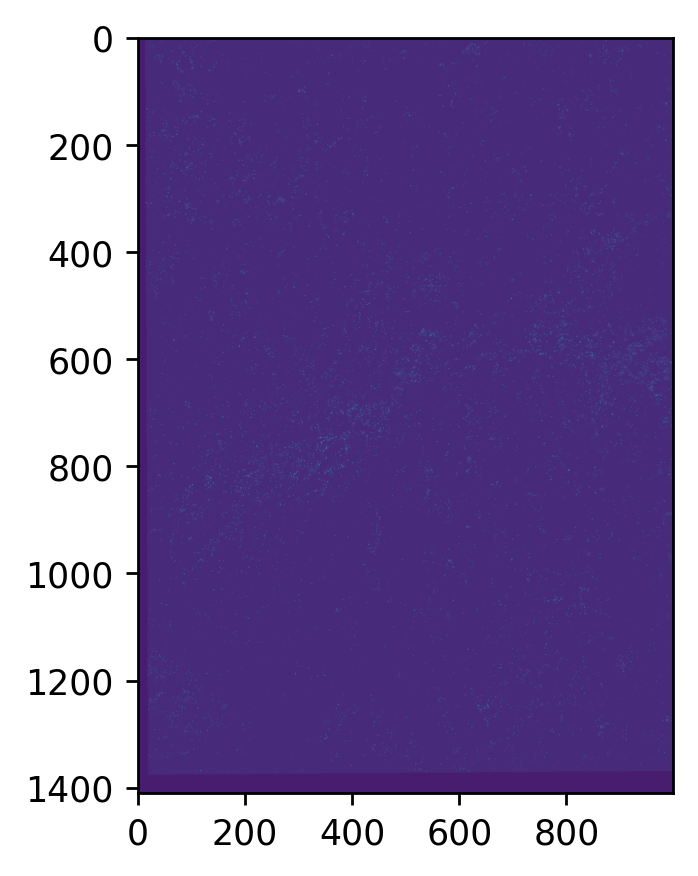

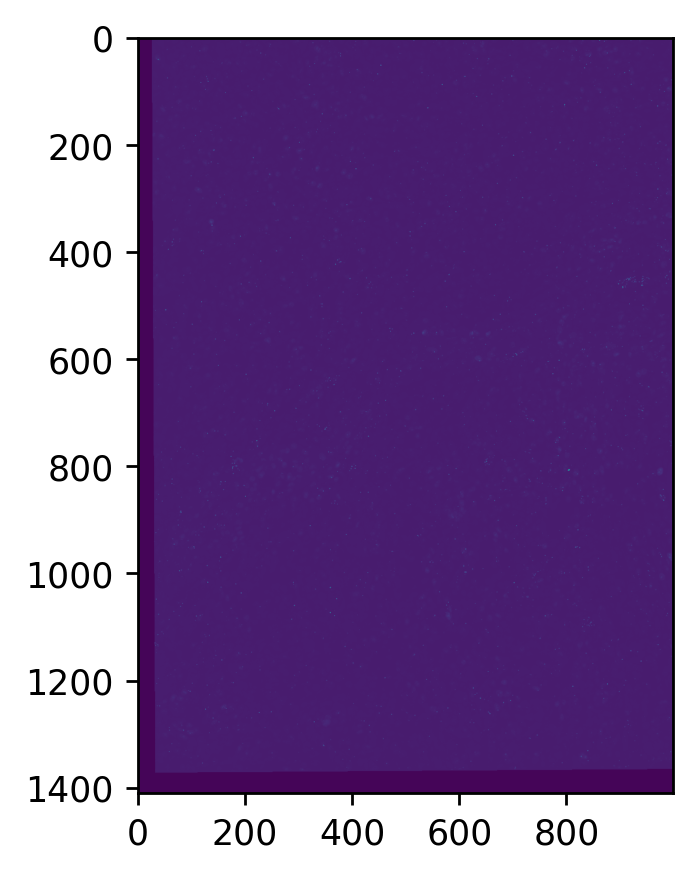

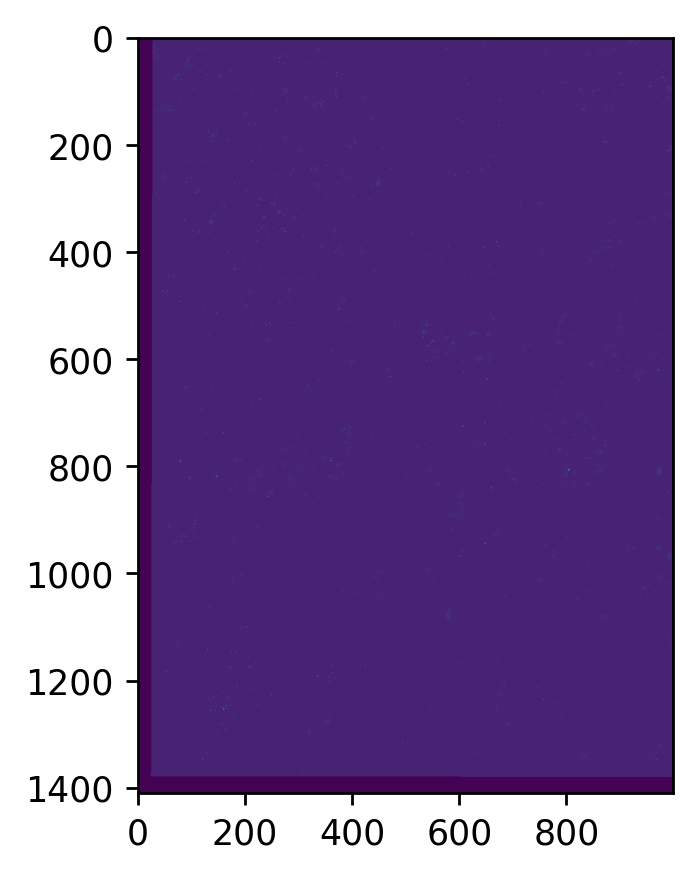

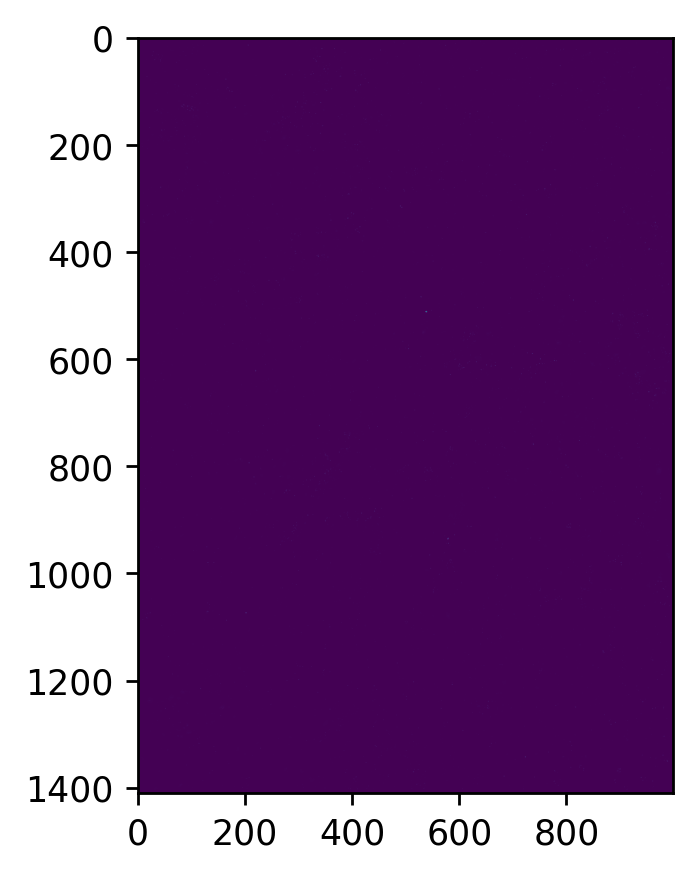

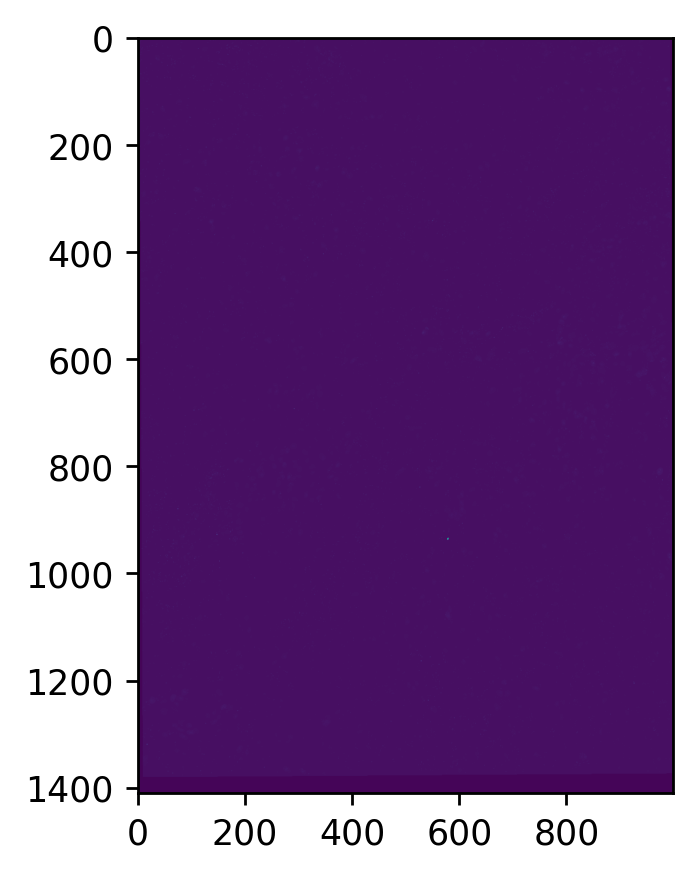

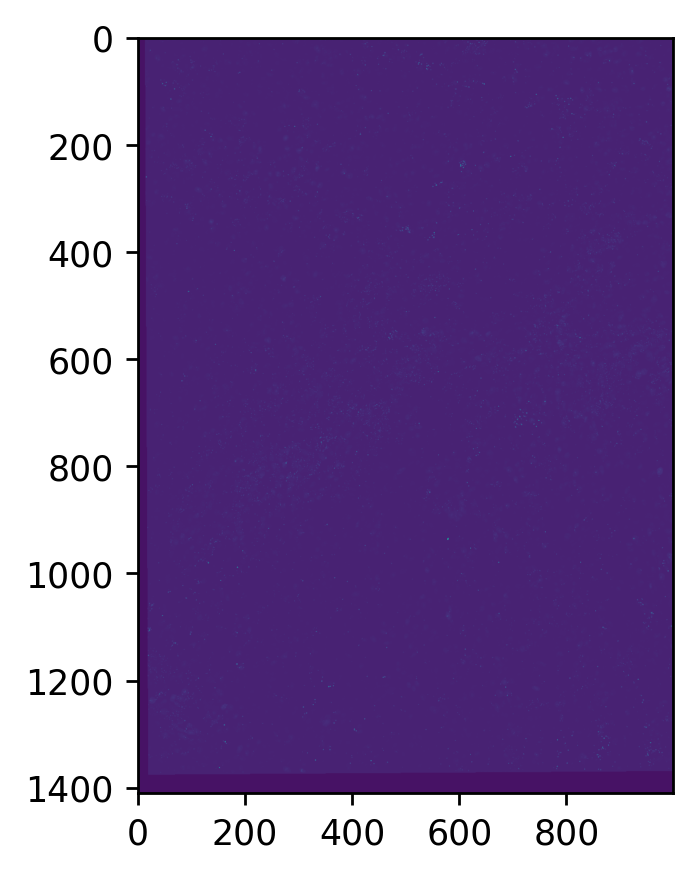

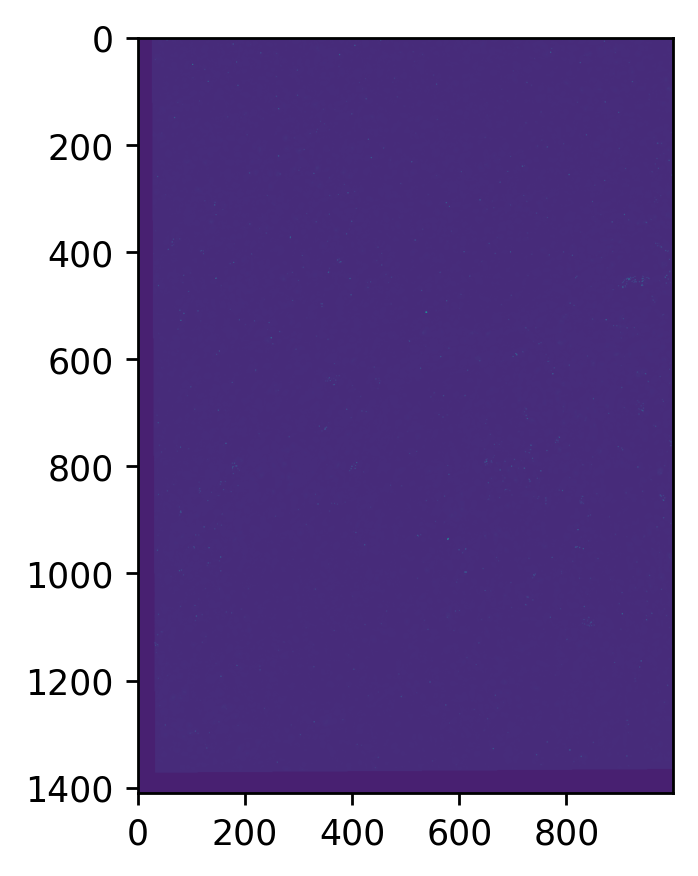

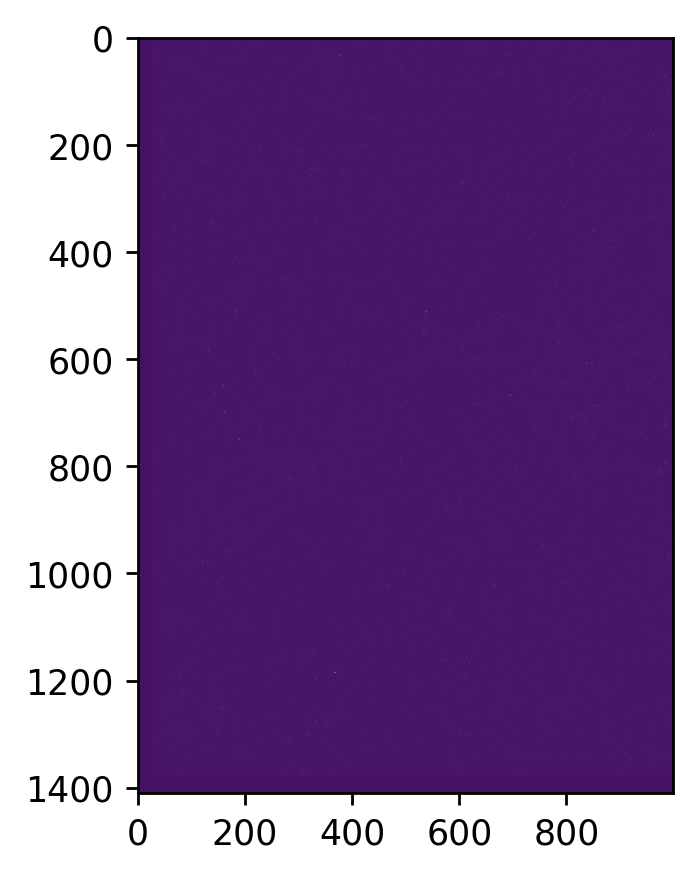

In [21]:
for i in range(X.shape[0]):
    plt.figure(dpi=250)
    plt.imshow(X[i, 0,])

In [22]:
up = 10
down = 1360
left = 40
right = 960

Xcenter = dcp.remove_border(X, up=up, down=down, left=left, right=right)

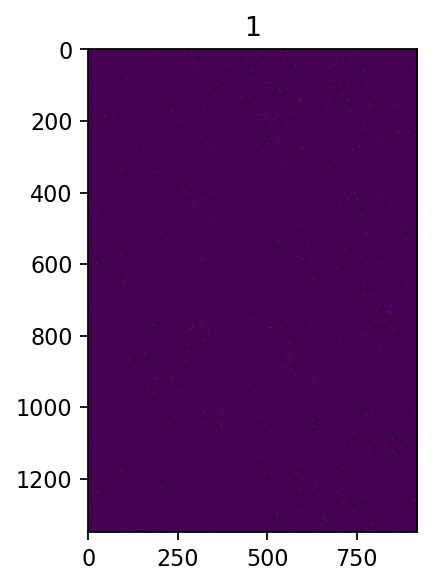

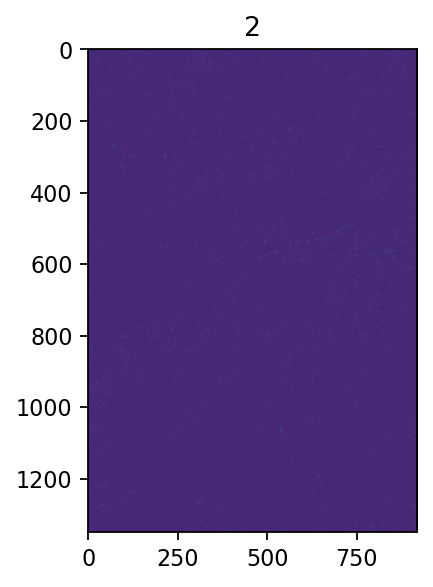

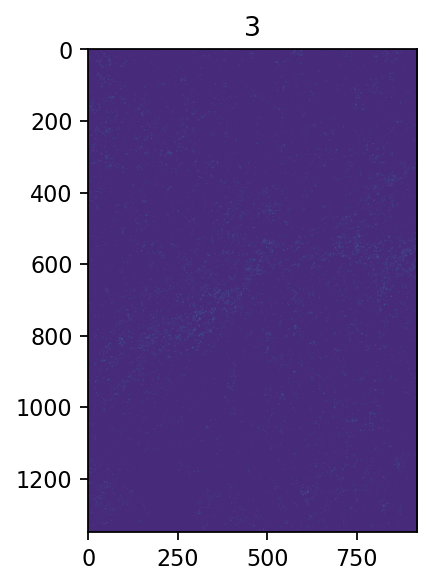

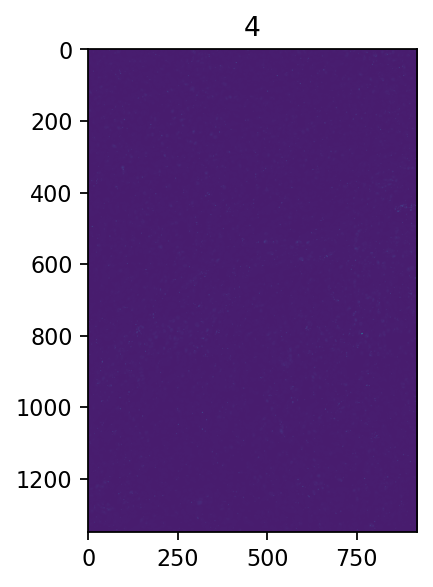

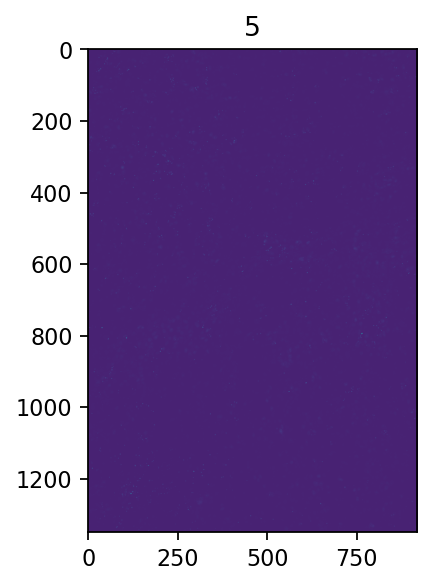

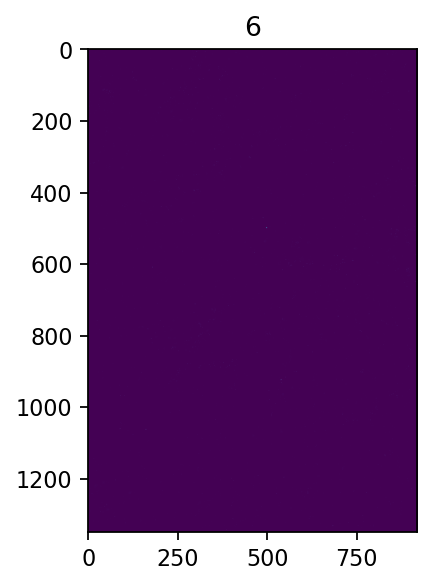

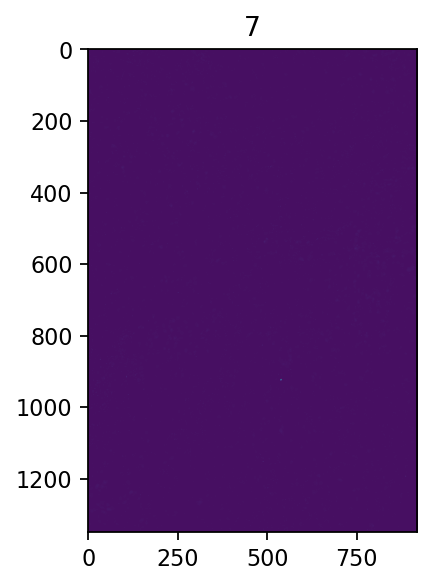

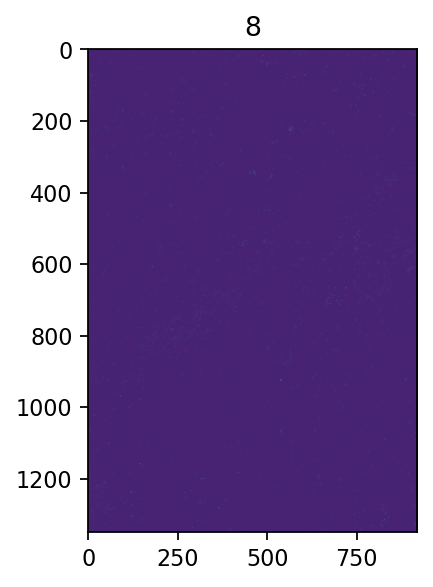

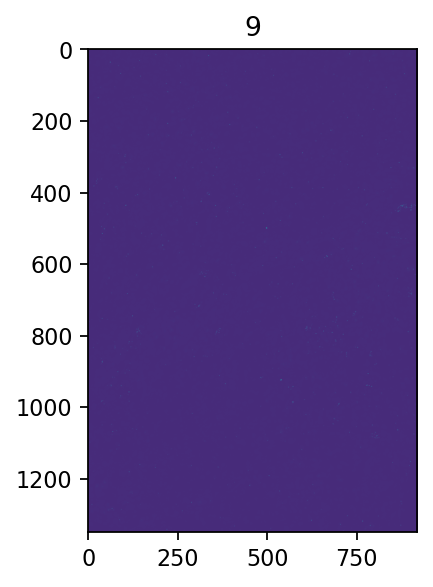

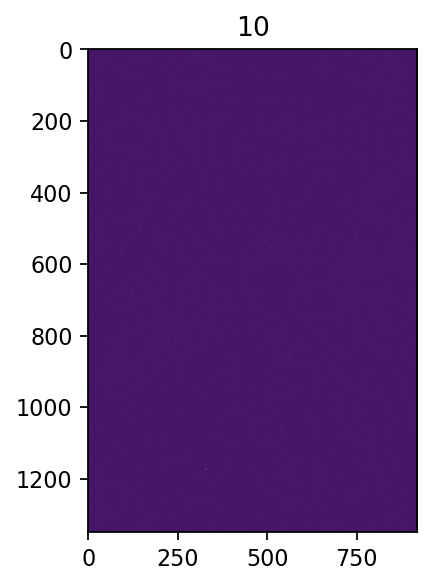

In [23]:
for i in range(Xcenter.shape[0]):
    plt.figure(dpi=160)
#     plt.imshow(find_boundaries(masks_mem[1000:, ]))
    plt.imshow(Xcenter[i, 0,])
    plt.title(i+1)

## Codebook

The most important is to make sure the codebook and the images are of the same order

In [24]:
codebook = pd.read_csv('./data/CRISPRmap_pilot_codebook_default.csv', dtype=np.int, header=None)
codebook = np.array(codebook)
codebook

array([[1, 0, 0, 0, 0, 1, 0, 0, 0, 0],
       [0, 0, 0, 1, 0, 0, 0, 0, 1, 0],
       [0, 1, 0, 0, 0, 0, 1, 0, 0, 0],
       [0, 0, 0, 0, 1, 0, 0, 0, 0, 1],
       [0, 0, 1, 0, 0, 0, 0, 1, 0, 0],
       [0, 1, 0, 0, 0, 1, 0, 0, 0, 0],
       [0, 0, 1, 0, 0, 1, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 1, 0, 0, 0],
       [0, 0, 1, 0, 0, 0, 1, 0, 0, 0],
       [0, 1, 0, 0, 0, 0, 0, 1, 0, 0]])

In [25]:
codebook.shape

(10, 10)

## Background subtraction

In [26]:
Xcenter.shape

(10, 1, 1350, 920)

<Figure size 600x400 with 0 Axes>

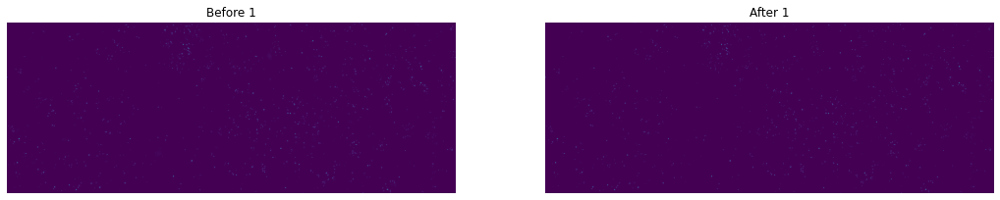

<Figure size 600x400 with 0 Axes>

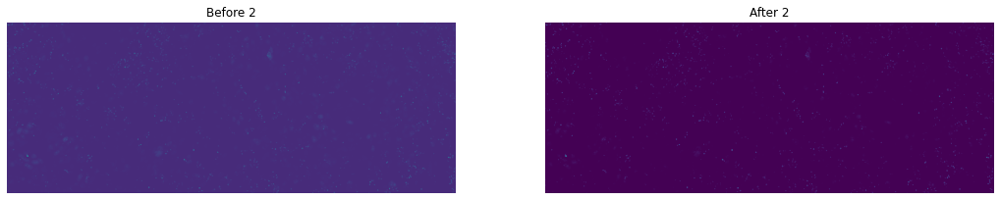

<Figure size 600x400 with 0 Axes>

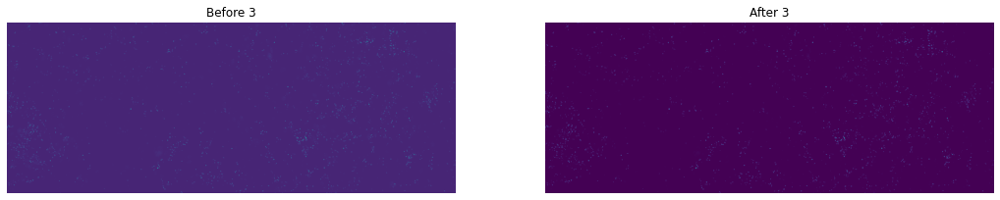

<Figure size 600x400 with 0 Axes>

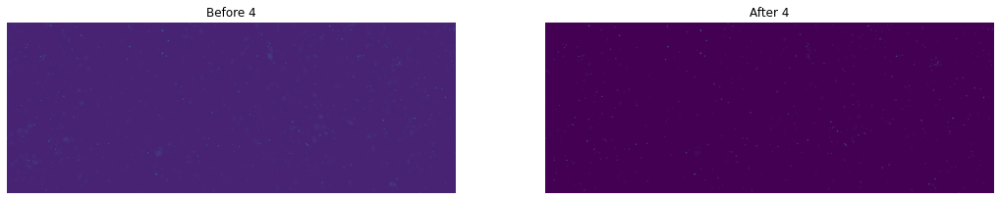

<Figure size 600x400 with 0 Axes>

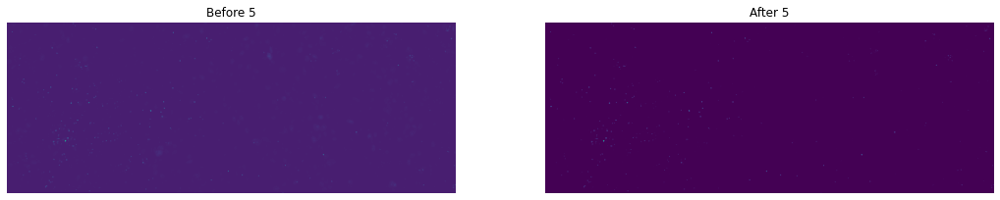

<Figure size 600x400 with 0 Axes>

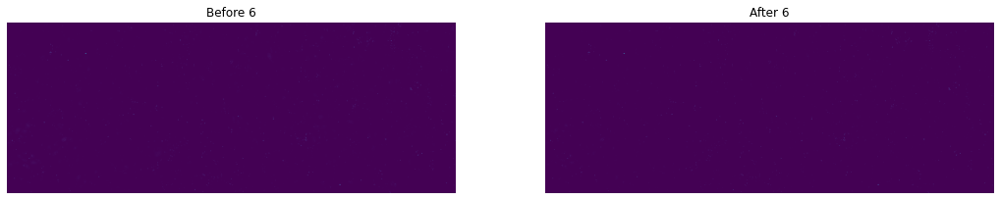

<Figure size 600x400 with 0 Axes>

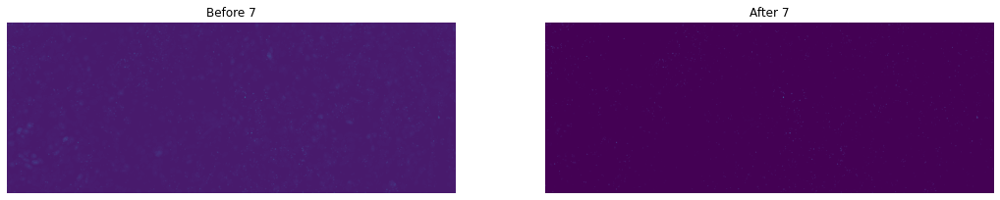

<Figure size 600x400 with 0 Axes>

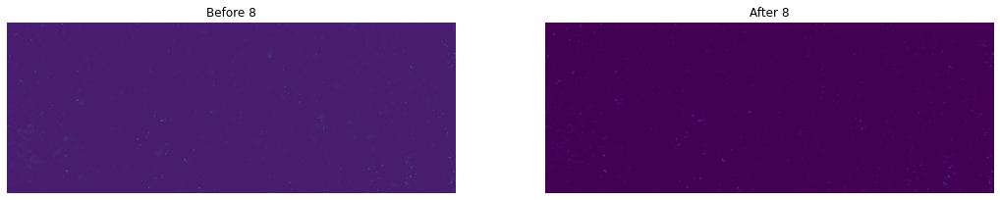

<Figure size 600x400 with 0 Axes>

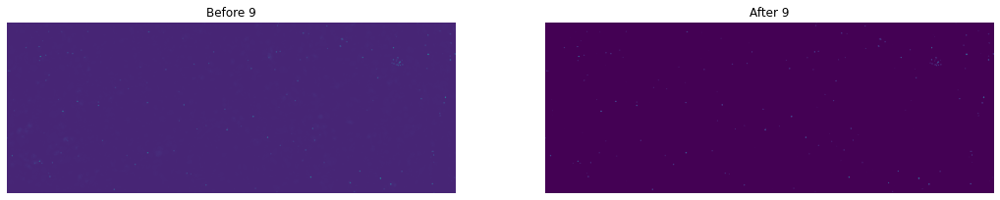

<Figure size 600x400 with 0 Axes>

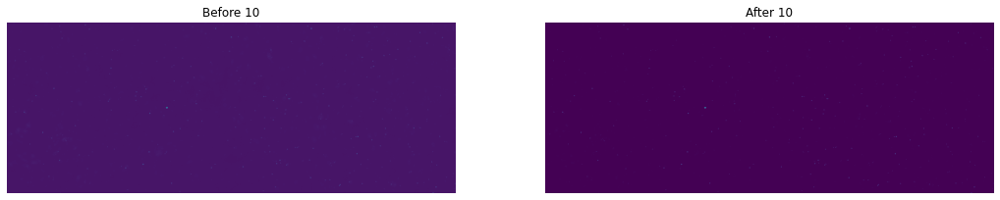

In [27]:
# Xnorm = bardensr.preprocessing.background_subtraction(Xcenter, [0,33,33])
Xnorm = Xcenter - filters.gaussian(Xcenter, sigma=3, mode='nearest', preserve_range=True)
Xnorm = np.clip(Xnorm, 0, Xnorm.max())
# for i in range(Xnorm.shape[0]):
#     plt.figure(dpi=100)
#     fig, axes = plt.subplots(ncols=2, figsize=(18, 18))
#     ax = axes.ravel()

#     ax[0].imshow(Xcenter[i, 0, 1000:, ])
#     ax[0].set_title(f'Before {i+1}')

#     ax[1].imshow(Xnorm[i, 0, 1000:, ])
#     ax[1].set_title(f'After {i+1}')

#     for a in ax:
#         a.axis('off')

#     plt.show()
# Xnorm = bardensr.preprocessing.minmax(Xnorm)
Xnorm = (Xnorm - Xnorm.min()) / Xnorm.max()
for i in range(Xnorm.shape[0]):
    plt.figure(dpi=100)
    fig, axes = plt.subplots(ncols=2, figsize=(18, 18))
    ax = axes.ravel()

    ax[0].imshow(Xcenter[i, 0, 1000:, ])
    ax[0].set_title(f'Before {i+1}')

    ax[1].imshow(Xnorm[i, 0, 1000:, ])
    ax[1].set_title(f'After {i+1}')

    for a in ax:
        a.axis('off')

    plt.show()

## Thresholding

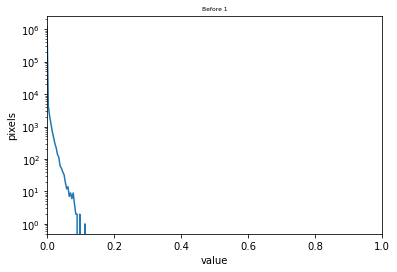

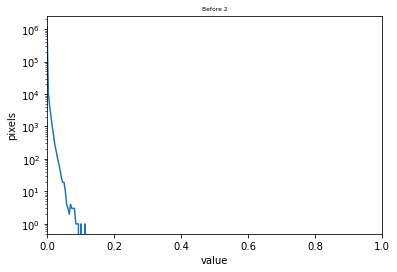

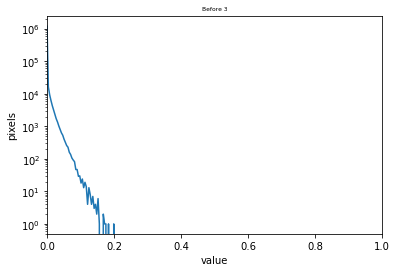

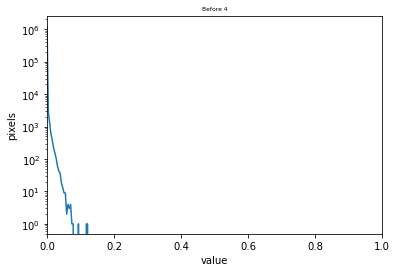

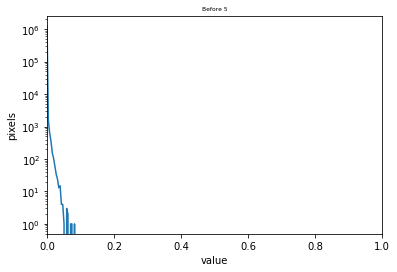

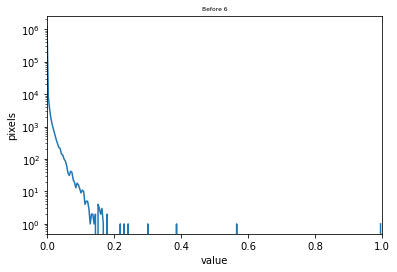

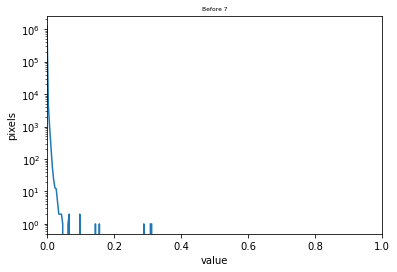

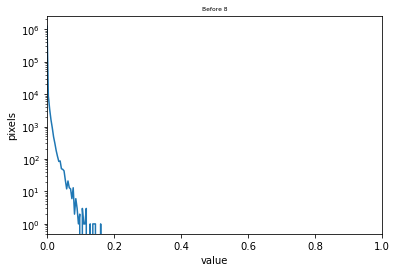

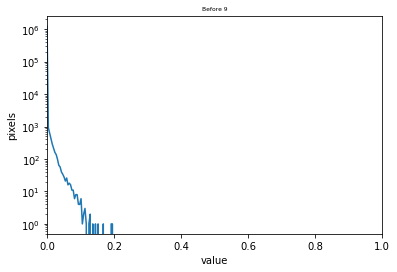

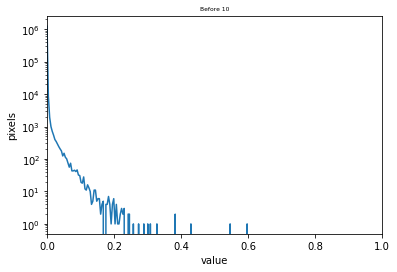

In [28]:
# Distributions before thresholding
for i in range(Xnorm.shape[0]):
    histogram, bin_edges = np.histogram(Xnorm[i, 0, ], bins=256, range=(0, 1))
    plt.figure()
    plt.title(f"Before {i+1}", fontsize=6)
    plt.xlabel("value")
    plt.ylabel("pixels")
    plt.semilogy(bin_edges[0:-1], histogram)
    plt.xlim([0.0, 1.0])
    plt.show()

In [29]:
# Xthresh = Xnorm.copy()
# for i in range(Xthresh.shape[0]):
#     Xthresh[i, 0] = exposure.match_histograms(Xnorm[i, 0], Xnorm[1, 0])  # match histogram to Xnorm[1, 0]

In [30]:
Xcenter.shape

(10, 1, 1350, 920)

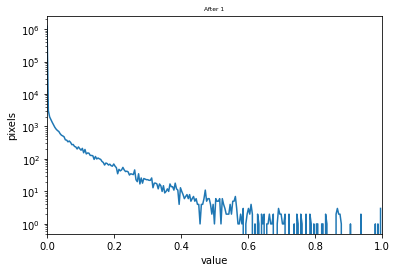

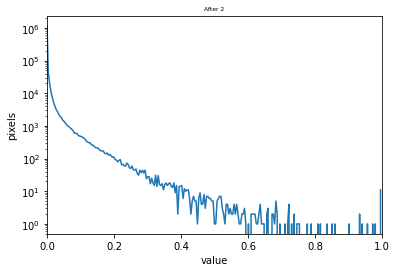

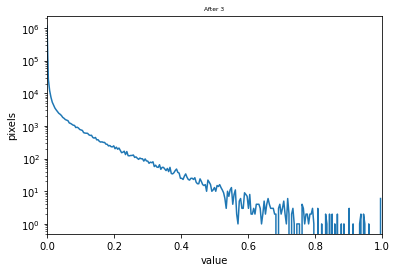

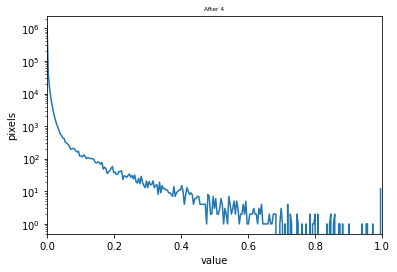

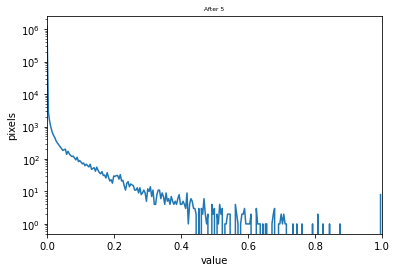

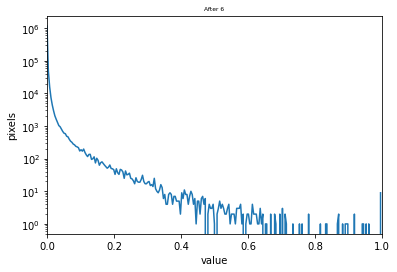

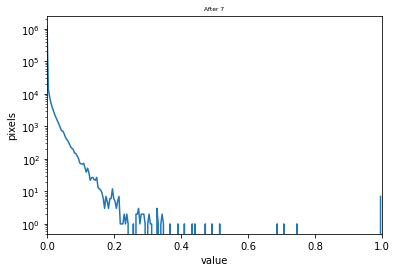

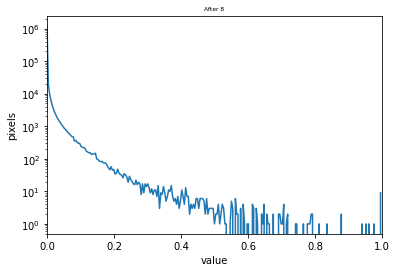

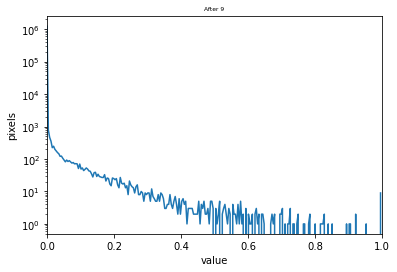

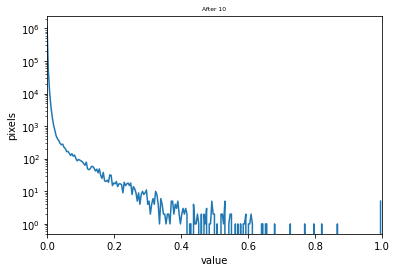

In [31]:
# Don't split this cell
upper = dcp.upper_thresh(Xnorm, n_channels=n_channels, n_cycles=n_cycles, min_bin=2)
Xthresh = dcp.upper_collapse(Xnorm, upper)
Xthresh = bardensr.preprocessing.minmax(Xthresh)

# After
for i in range(Xthresh.shape[0]):
    histogram, bin_edges = np.histogram(Xthresh[i, 0, ], bins=256, range=(0, 1))
    plt.figure()
    plt.title(f"After {i+1}", fontsize=6)
    plt.xlabel("value")
    plt.ylabel("pixels")
    plt.semilogy(bin_edges[0:-1], histogram)
    plt.xlim([0.0, 1.0])
    plt.show()

# Xthresh = dcp.lower_thresh(Xthresh)
# residual = 0.01
# Xthresh[Xthresh < residual] = 0
# Xthresh = Xthresh > residual

In [32]:
# for i in range(Xthresh.shape[0]):
#     plt.figure(dpi=100)
#     fig, axes = plt.subplots(ncols=2, figsize=(18, 18))
#     ax = axes.ravel()

# #     ax[0].imshow(find_boundaries(masks_mem[up:down, left:right][1000:, ]), alpha=0.5)
# #     ax[0].imshow(Xcenter[i, 0, 1000:, ])
#     ax[0].imshow(Xnorm[i, 0, 1000:, ])
#     ax[0].set_title(f'Before {i+1}')

# #     ax[1].imshow(find_boundaries(masks_mem[up:down, left:right][1000:, ]), alpha=0.5)
# #     ax[1].imshow(Xthresh[i, 0, 400:600, 400:600])
#     ax[1].imshow(Xthresh[i, 0, 1000:, ])
#     ax[1].set_title(f'After {i+1}')

#     for a in ax:
#         a.axis('off')

#     plt.show()

In [33]:
Xthresh[0,0].shape

(1350, 920)

## Prediction

0.04872854104521514


<Figure size 960x640 with 0 Axes>

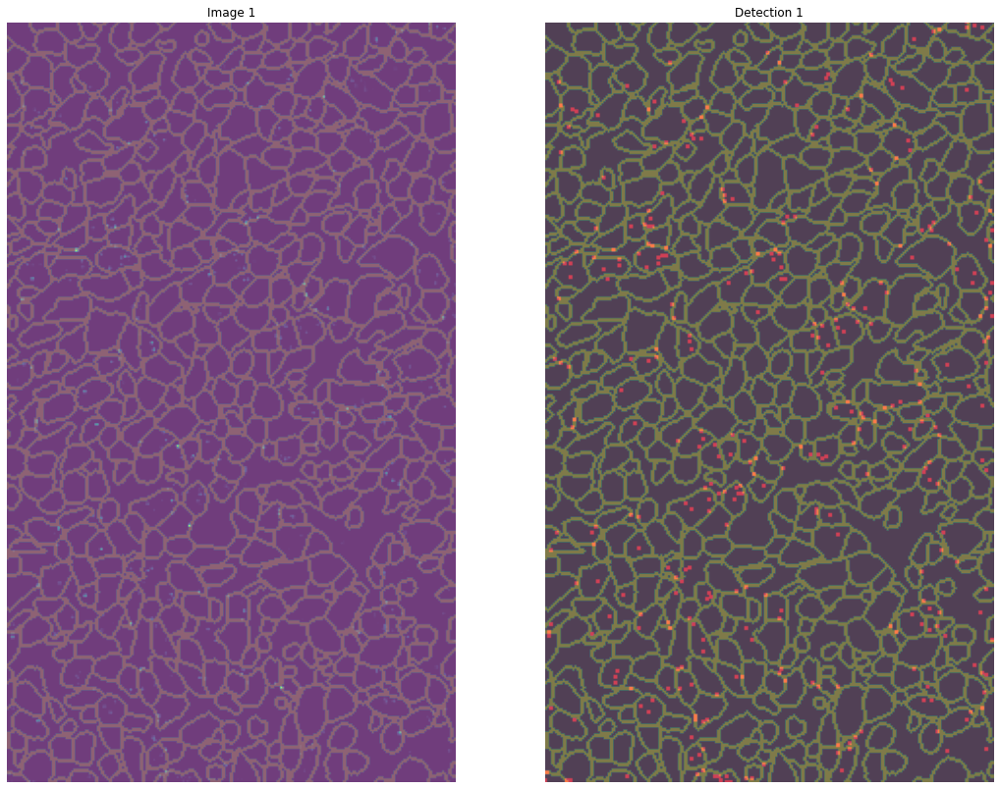

0.09886559027055429


<Figure size 960x640 with 0 Axes>

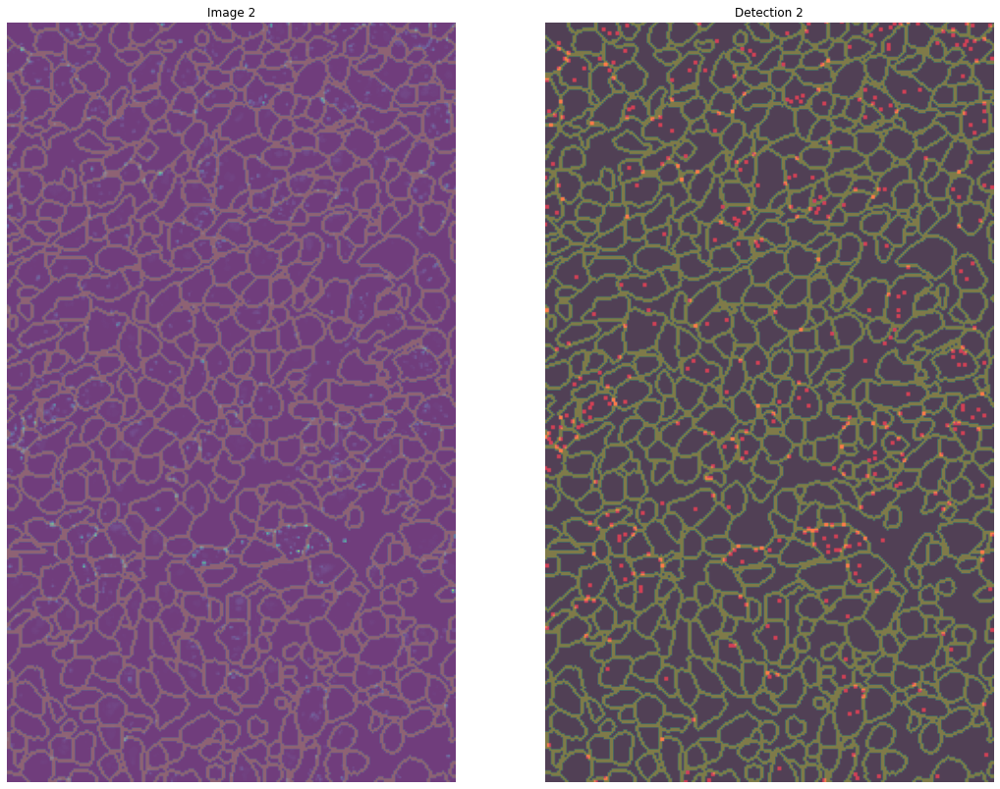

0.16014617608300702


<Figure size 960x640 with 0 Axes>

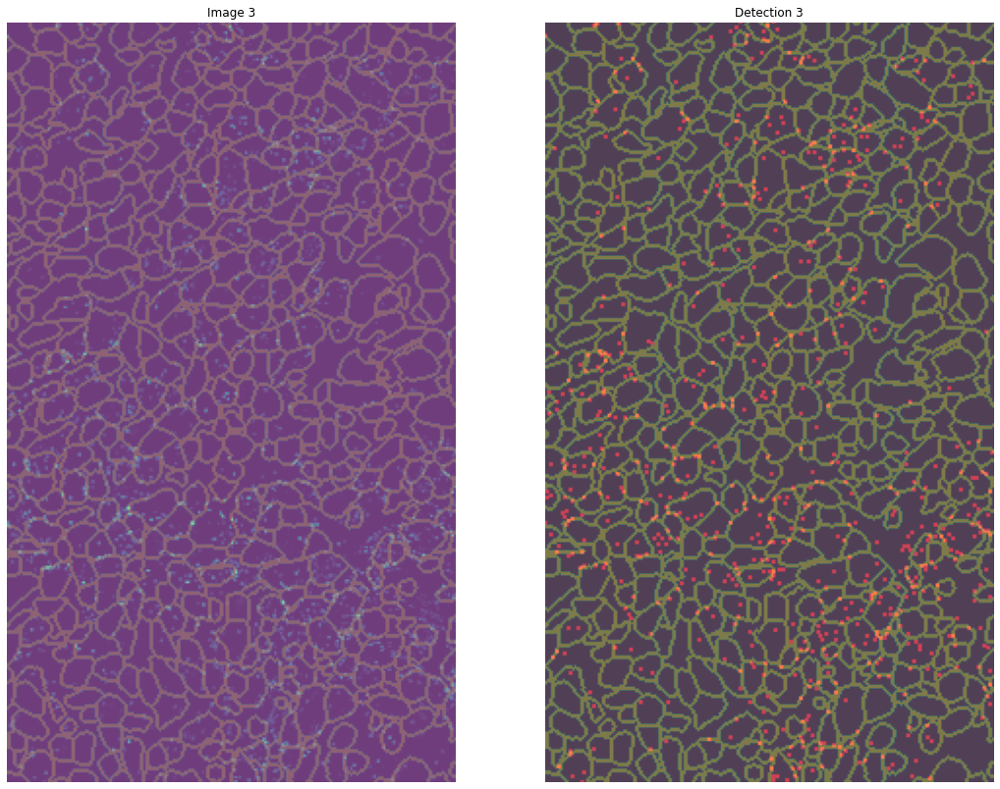

0.03527176029351456


<Figure size 960x640 with 0 Axes>

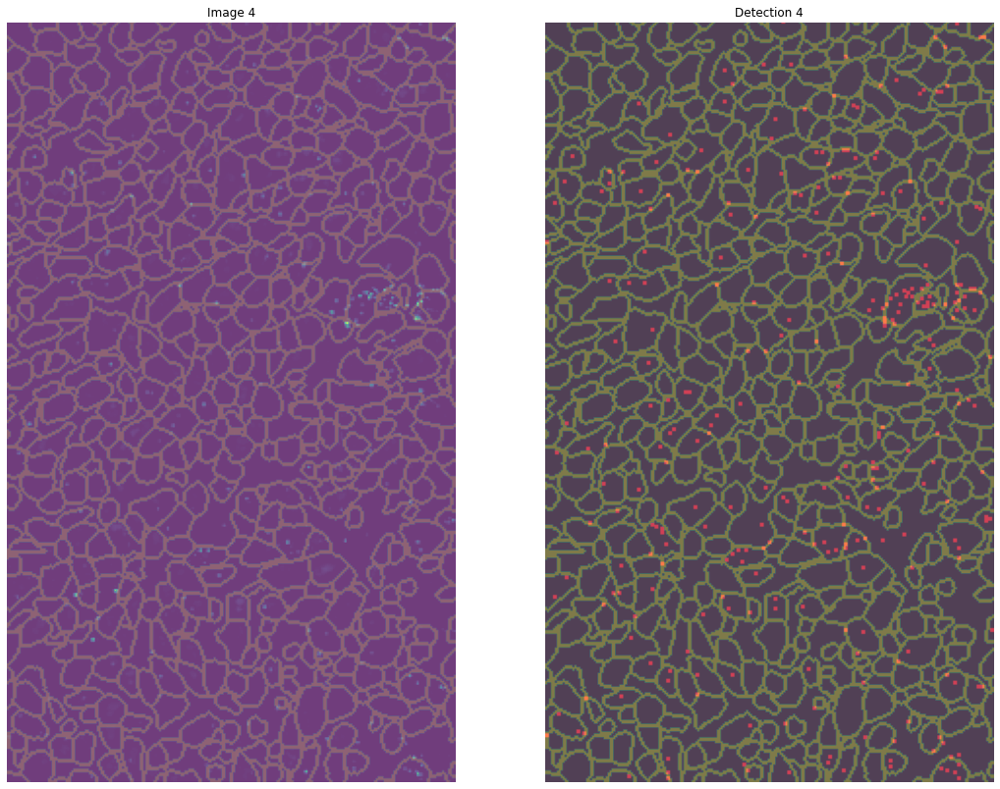

0.009146280452810317


<Figure size 960x640 with 0 Axes>

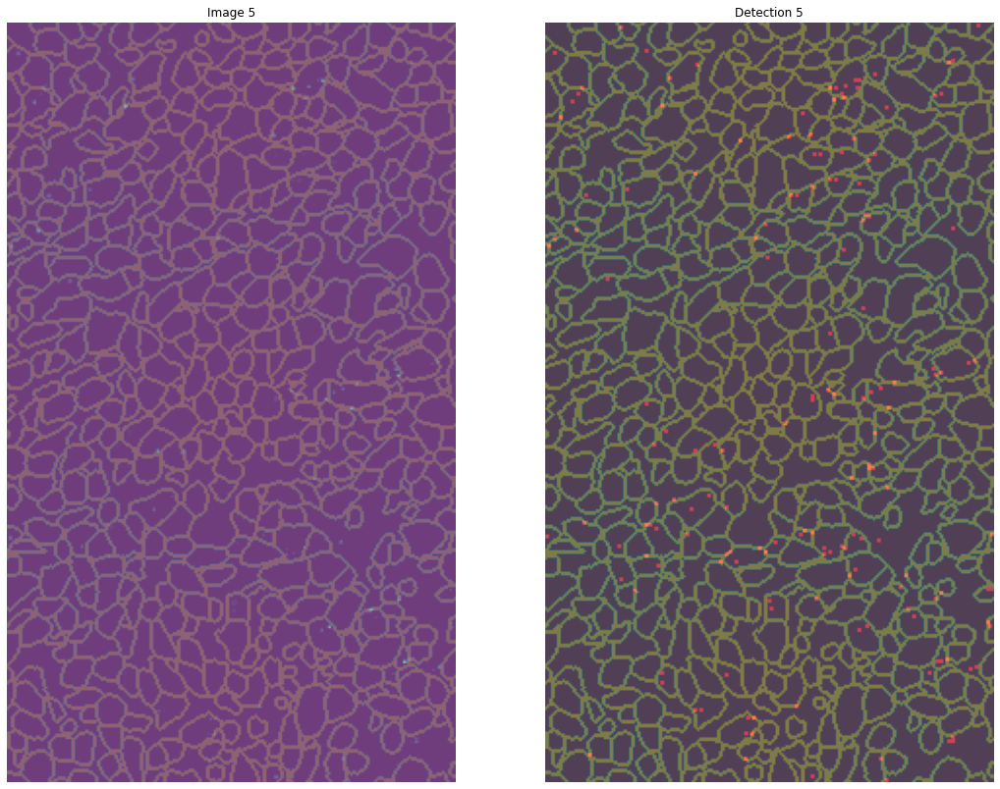

0.048959575809428994


<Figure size 960x640 with 0 Axes>

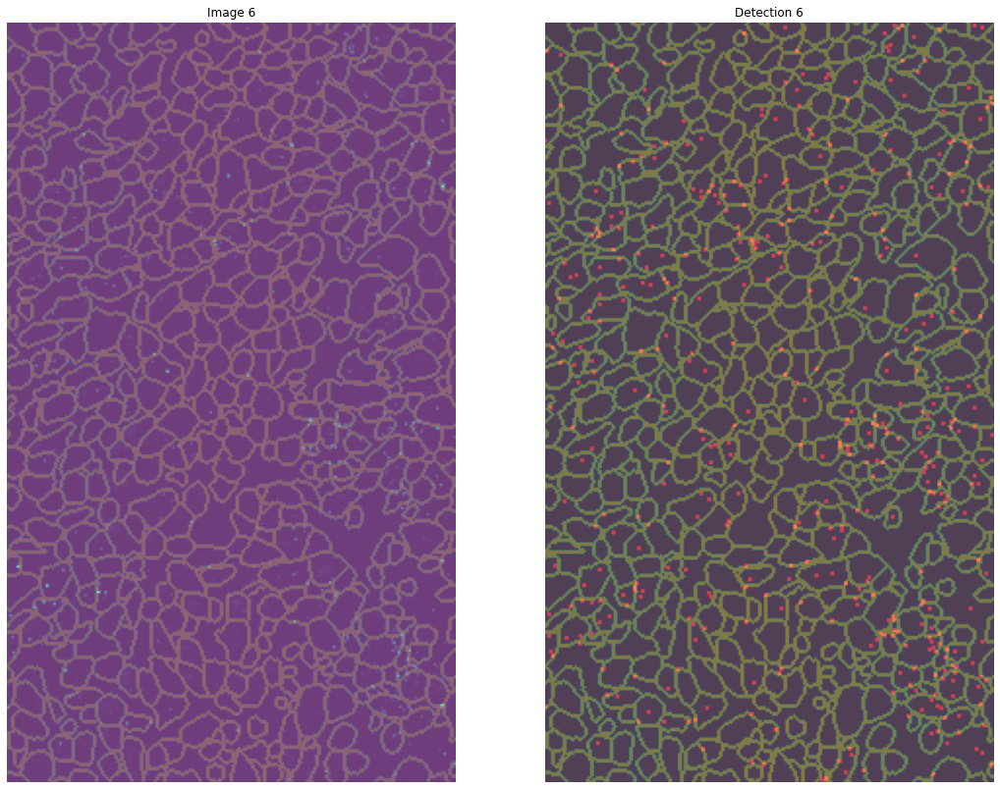

0.03219436475588856


<Figure size 960x640 with 0 Axes>

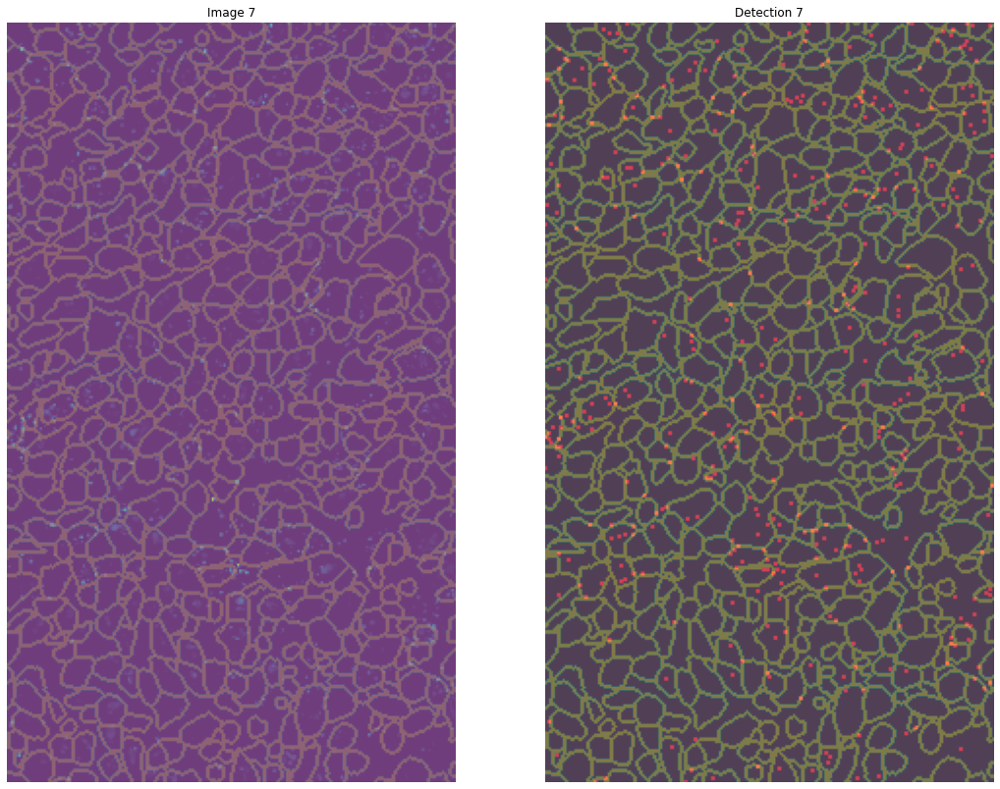

0.061405757232014475


<Figure size 960x640 with 0 Axes>

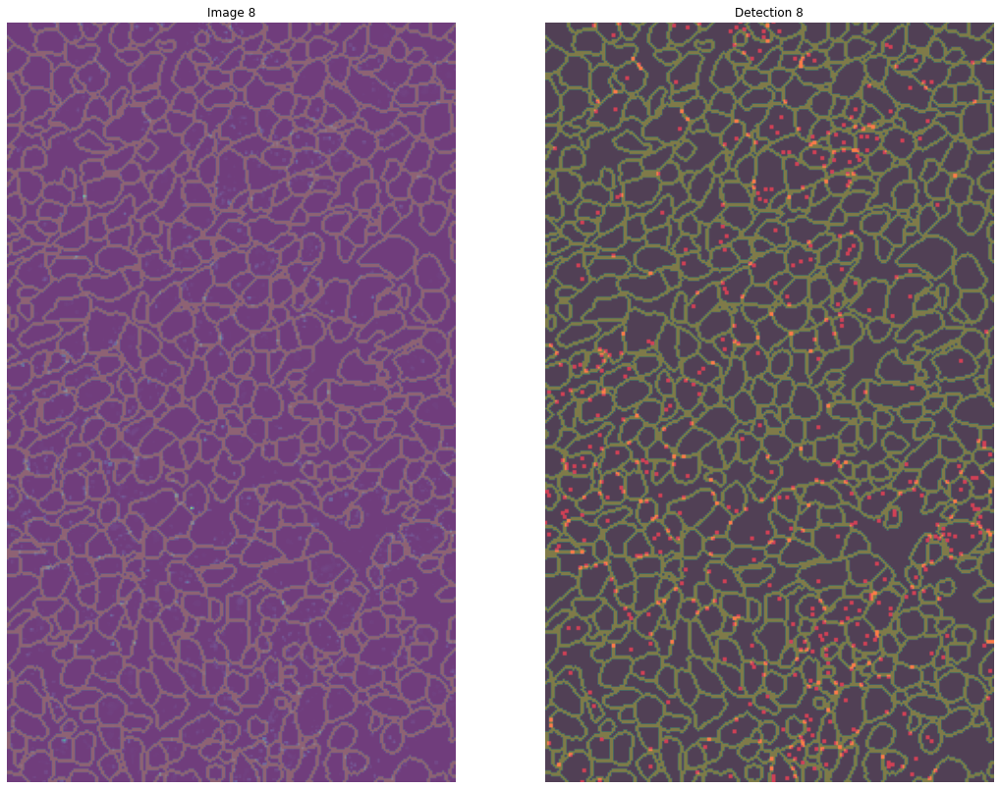

1.0791423350297175e-05


<Figure size 960x640 with 0 Axes>

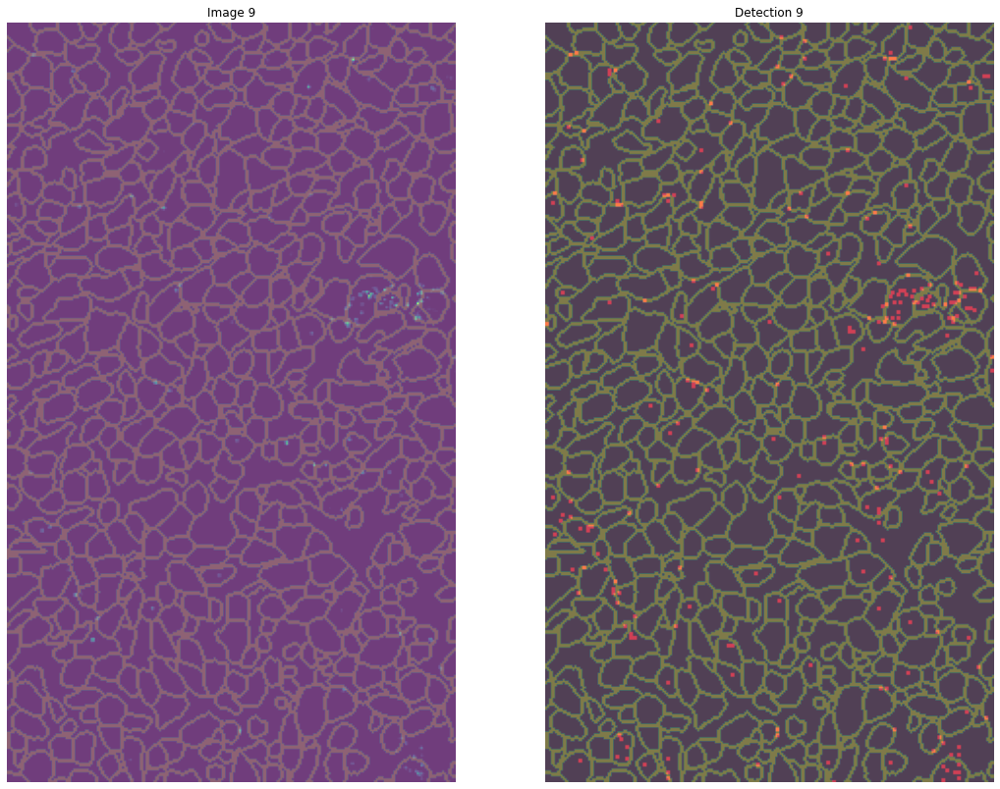

0.016557343252345133


<Figure size 960x640 with 0 Axes>

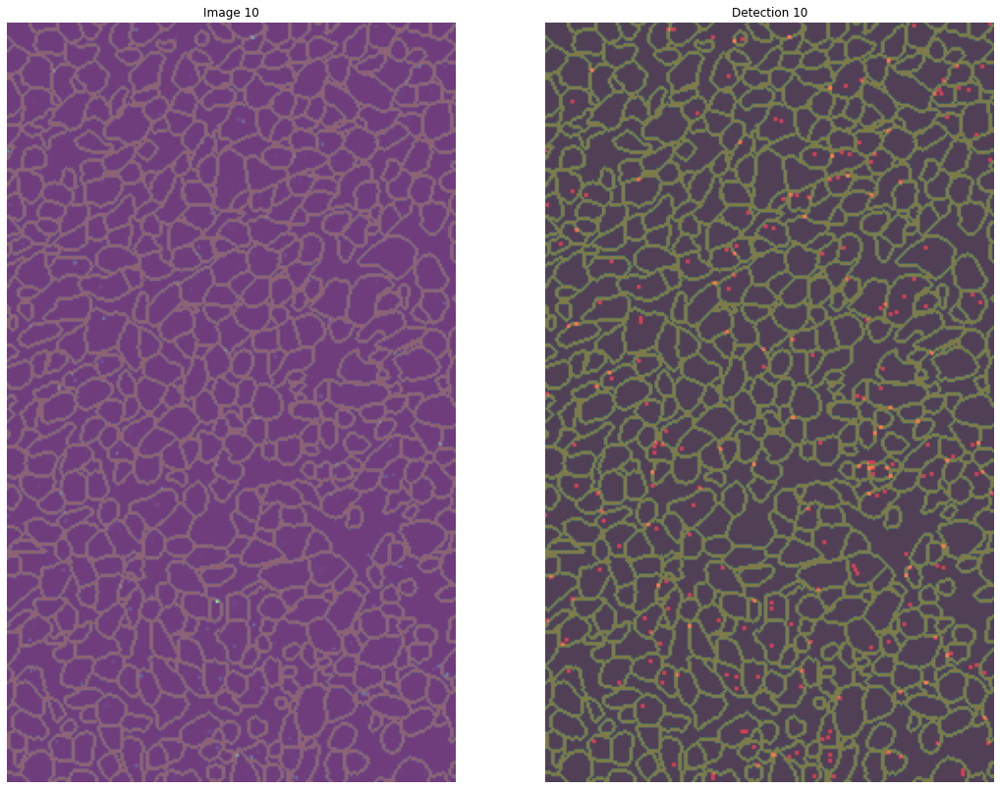

In [35]:
# cell_table = dcp.create_celltable(Xthresh, masks_mem, up_adjust=up, left_adjust=left)
# cell_table

# cell_table = np.zeros((len(np.unique(masks_mem)), Xthresh.shape[0]))
vector = np.vectorize(np.int)
masks_mem = vector(masks_mem)
cell_table = np.zeros((np.max(masks_mem)+1, Xthresh.shape[0]))

all_coords = np.zeros((0, 2))
# spotMask = np.zeros((Xthresh.shape[2], Xthresh.shape[3], 3))

for k in range(Xthresh.shape[0]):  # for the kth image

    spotMask = np.zeros((Xthresh.shape[2], Xthresh.shape[3], 3))
    
    max_fil = ndimage.maximum_filter(Xthresh[k, 0], size=(3, 3), mode='nearest')
#     h = max_fil.mean() + max_fil.std() * 4
    h = np.percentile(Xthresh[k, 0].ravel(), 99.3)
    print(h)
#     max_fil[(max_fil > Xthresh[k, 0]) || (max_fil < h)] = 0

    # Get the positions of the maxima
    coords = np.argwhere((max_fil == Xthresh[k, 0]) & (max_fil >= h))
    all_coords = np.r_[all_coords, coords]
    

    for y, x in coords:
        xindex = int(np.round(x))
        yindex = int(np.round(y))
        spotMask[yindex-1:yindex+1, xindex-1:xindex+1] = (1, 0, 0)


    plt.figure(dpi=160)
    fig, axes = plt.subplots(ncols=2, figsize=(18, 18))
    ax = axes.ravel()

    ax[0].imshow(find_boundaries(masks_mem[up:down, left:right][300:690, 690:940]), alpha=0.4)
    ax[0].imshow(Xthresh[k, 0, 300:690, 690:940], alpha=0.6)
#     ax[0].imshow(find_boundaries(masks_mem[up:down, left:right]), alpha=0.4)
#     ax[0].imshow(Xthresh[k, 0], alpha=0.5)
#     ax[0].imshow(Xcenter[k, 0, 1000:, ], alpha=0.5)
    ax[0].set_title(f'Image {k+1}')

    ax[1].imshow(find_boundaries(masks_mem[up:down, left:right][300:690, 690:940]), alpha=0.5)
    ax[1].imshow(spotMask[300:690, 690:940], alpha=0.5)
#     ax[1].imshow(find_boundaries(masks_mem[up:down, left:right]), alpha=0.5)
#     ax[1].imshow(spotMask, alpha=0.5)
    ax[1].set_title(f'Detection {k+1}')

    for a in ax:
        a.axis('off')
    plt.show()

    #for _, m1, m2 in coords:
    for m1, m2 in coords:
        m1 = int(np.round(m1))
        m2 = int(np.round(m2))
        mem_id = masks_mem[m1+up, m2+left]  # important to match the coordinates if images are trimmed
        if mem_id>0: # 0 is background
#             cell_table.loc[mem_id, k] += 1
            cell_table[mem_id, k] += 1

In [ ]:
# cell_table = dcp.create_celltable(Xthresh, masks_mem, up_adjust=up, left_adjust=left)
# cell_table

cell_table = np.zeros((len(np.unique(masks_mem)), Xthresh.shape[0]))

all_coords = np.zeros((0, 2))
spotMask = np.zeros((Xthresh.shape[2], Xthresh.shape[3], 3))

for k in range(Xthresh.shape[0]):  # for the kth image

#     spotMask = np.zeros((Xthresh.shape[2], Xthresh.shape[3], 3))
    
    max_fil = ndimage.maximum_filter(Xthresh[k, 0], size=(3, 3), mode='nearest')
#     h = max_fil.mean() + max_fil.std() * 4
    h = np.percentile(Xthresh[k, 0].ravel(), 99)
    print(h)
#     max_fil[(max_fil > Xthresh[k, 0]) || (max_fil < h)] = 0

    # Get the positions of the maxima
    coords = np.argwhere((max_fil == Xthresh[k, 0]) & (max_fil >= h))
    all_coords = np.r_[all_coords, coords]
    

    for y, x in coords:
        xindex = int(np.round(x))
        yindex = int(np.round(y))
        spotMask[yindex-1:yindex+1, xindex-1:xindex+1] = (1, 0, 0)


#     plt.figure(dpi=160)
#     fig, axes = plt.subplots(ncols=2, figsize=(18, 18))
#     ax = axes.ravel()

#     ax[0].imshow(find_boundaries(masks_mem[up:down, left:right][300:690, 690:940]), alpha=0.4)
#     ax[0].imshow(Xthresh[k, 0, 300:690, 690:940], alpha=0.6)
# #     ax[0].imshow(find_boundaries(masks_mem[up:down, left:right]), alpha=0.4)
# #     ax[0].imshow(Xthresh[k, 0], alpha=0.5)
# #     ax[0].imshow(Xcenter[k, 0, 1000:, ], alpha=0.5)
#     ax[0].set_title(f'Image {k+1}')

#     ax[1].imshow(find_boundaries(masks_mem[up:down, left:right][300:690, 690:940]), alpha=0.5)
#     ax[1].imshow(spotMask[300:690, 690:940], alpha=0.5)
# #     ax[1].imshow(find_boundaries(masks_mem[up:down, left:right]), alpha=0.5)
# #     ax[1].imshow(spotMask, alpha=0.5)
#     ax[1].set_title(f'Detection {k+1}')

#     for a in ax:
#         a.axis('off')
#     plt.show()

    #for _, m1, m2 in coords:
    for m1, m2 in coords:
        m1 = int(np.round(m1))
        m2 = int(np.round(m2))
        mem_id = masks_mem[m1+up, m2+left]  # important to match the coordinates if images are trimmed
        if mem_id>0: # 0 is background
#             cell_table.loc[mem_id, k] += 1
            cell_table[mem_id, k] += 1

In [ ]:
# find_boundaries(masks_mem[up:down, left:right]).shape

In [52]:
# import pickle as pkl
# filehandler = open('./result/crispmap20210928Xenograft_Xthresh.pkl', 'wb')
# pkl.dump(Xthresh, filehandler)
# filehandler.close()

In [ ]:
test_pkl = pkl.load(open('./result/crispmap20210928Xenograft_Xthresh.pkl', 'rb'))
test_pkl.shape

In [36]:
Xthresh.shape

(10, 1, 1350, 920)

In [37]:
spotMask.shape

(1350, 920, 3)

In [38]:
# plt.imshow(find_boundaries(masks_mem))

In [39]:
# pd.DataFrame(cell_table).to_csv('./result/crisprmap20210714sg2NEB_cell_table.csv')

In [40]:
cell_table.shape

(12886, 10)

In [41]:
cell_corr = dcp.cal_metric(cell_table, codebook)
corr_thresh = 0.001
alpha = 0.05  
beta = 0.8  # power
thresh_corr_diff = 0.26
cell_id = pd.DataFrame(dcp.argmax_thresh(cell_corr, axis=1, thresh=corr_thresh), columns=['barcode'])
cell_id['correlation_max'] = dcp.minmax(np.max(cell_corr, axis=1), min_all=np.min(cell_corr), max_all=np.max(cell_corr))
cell_id['correlation_2nd_max'] = dcp.minmax([heapq.nlargest(2, cell_corr[i,])[1] for i in cell_id.index], min_all=np.min(cell_corr), max_all=np.max(cell_corr))
cell_id['correlation_difference'] = cell_id['correlation_max'] - cell_id['correlation_2nd_max']
cell_id['select_by_correlation'] = cell_id['correlation_difference'] > thresh_corr_diff
cell_id['spots_max'] = np.max(cell_table, axis=1)
cell_id['spots_sum'] = np.sum(cell_table, axis=1)
cell_id['spots_needed'] = cell_id['correlation_max'].apply(dcp.sample_size, alpha=alpha, beta=beta)
cell_id['select_by_spots'] = cell_id['spots_sum'] > cell_id['spots_needed']
cell_id['selected'] = cell_id['select_by_correlation'] & cell_id['select_by_spots']
cell_id['cells_with_spots'] = cell_id['spots_sum'] > 0
cell_id.head()

,barcode,correlation_max,correlation_2nd_max,correlation_difference,select_by_correlation,spots_max,spots_sum,spots_needed,select_by_spots,selected,cells_with_spots
0,-1,0.000000,0.0,0.000000,False,0.0,0.0,31395550336760,False,False,False
1,3,0.707106,0.0,0.707106,True,2.0,2.0,13,False,False,True
2,-1,0.000000,0.0,0.000000,False,0.0,0.0,31395550336760,False,False,False
3,-1,0.000000,0.0,0.000000,False,0.0,0.0,31395550336760,False,False,False
4,-1,0.000000,0.0,0.000000,False,0.0,0.0,31395550336760,False,False,False


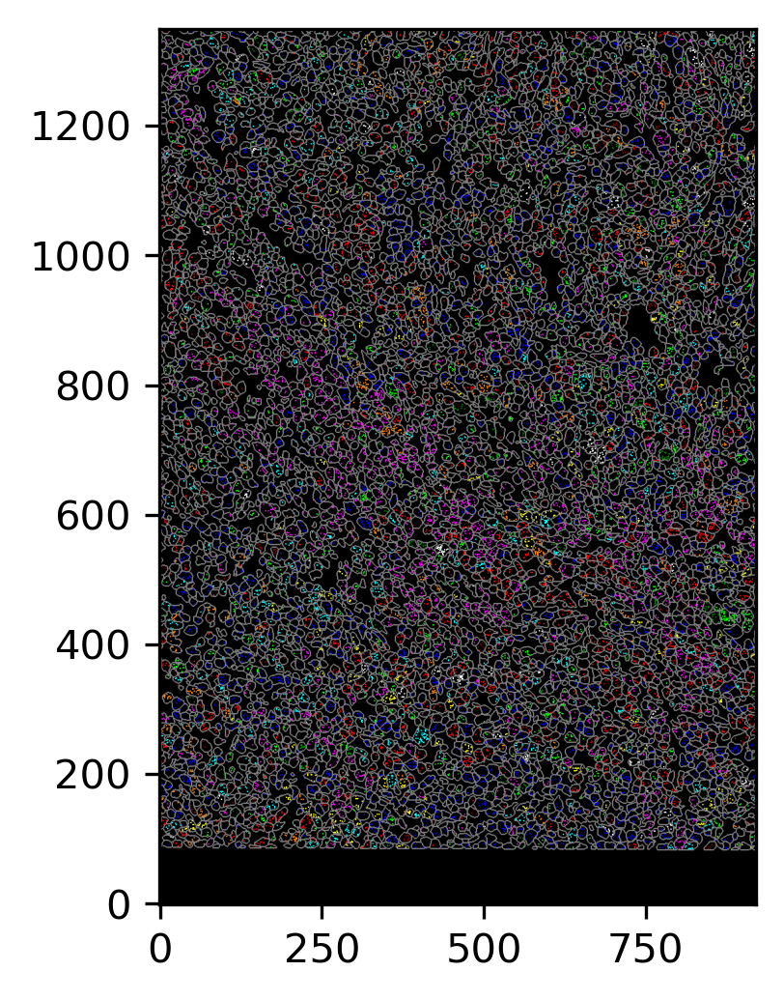

In [42]:
color_dict = {
    0: (0,0,255),
    1: (0,255,0),
    2: (255, 0, 0),
    3: (0,255,255),
    4: (255,0,255),
    5: (255,255,0),
    6: (255,127,0),
    7: (0,127,0),
    8: (127,0,0),
    9: (255,255,255)
}

for m1, m2 in all_coords:
    m1 = int(np.round(m1))
    m2 = int(np.round(m2))
    all_mem_id = masks_mem[m1+up, m2+left]  # important to match the coordinates if images are trimmed
    if mem_id>0: # 0 is background
#             cell_table.loc[mem_id, k] += 1
        cell_table[mem_id, k] += 1

all_spotMask = np.zeros((Xthresh.shape[2], Xthresh.shape[3], 3), dtype=np.uint8)
for y, x in all_coords:
    xindex = int(np.round(x))
    yindex = int(np.round(y))
    spot_barcode = cell_id.barcode[masks_mem[yindex+up, xindex+left]]
    if spot_barcode >= 0: # barcodes start from 0
        all_spotMask[yindex-1:yindex+1, xindex-1:xindex+1] = color_dict[spot_barcode]

all_spotMask[find_boundaries(masks_mem[up:down, left:right])] = (127, 127, 127)

plt.figure(dpi=300)

# plt.imshow(find_boundaries(masks_mem[up:down, left:right]), alpha=0.5)
plt.imshow(all_spotMask, origin='lower')

In [43]:
# all_spotMask[find_boundaries(masks_mem[up:down, left:right])]

In [44]:
print("The number of cells:", cell_id.shape[0]-1)
cell_no_spots = cell_id[cell_id.barcode==-1].shape[0]
print("The number of cells with no detected spots:", cell_no_spots)
print("Percent of cells with no detected spots:", cell_no_spots / (cell_id.shape[0] -1))
double_infected = cell_id.shape[0] -1 - cell_no_spots - np.sum(cell_id.select_by_correlation)
print("The number of double-infected cells:", double_infected)
print("Percent of double-infected cells:", double_infected / (cell_id.shape[0] -1))
low_spots = cell_id.shape[0] - 1 - np.sum(cell_id.select_by_spots)
# print("The number of cells that do not have enough spots to calculate a significant correlation or no spots:", low_spots)
# print("Percent of cells that do not have enough spots to calculate a significant correlation or no spots:", low_spots / (cell_id.shape[0] -1))
print("The number of cells that do not have enough spots to calculate a significant correlation:", low_spots - cell_no_spots)
print("Percent of cells that do not have enough spots to calculate a significant correlation:", (low_spots- cell_no_spots) / (cell_id.shape[0] -1))
print("The number of cells selected after removing double infection and low number of spots:", np.sum(cell_id.selected))
print("Percent of cells selected after removing double infection and low number of spots:", np.sum(cell_id.selected) / (cell_id.shape[0] -1))

The number of cells: 12885
The number of cells with no detected spots: 8075
Percent of cells with no detected spots: 0.626697710516104
The number of double-infected cells: 2493
Percent of double-infected cells: 0.19348079161816065
The number of cells that do not have enough spots to calculate a significant correlation: 3705
Percent of cells that do not have enough spots to calculate a significant correlation: 0.28754365541327126
The number of cells selected after removing double infection and low number of spots: 736
Percent of cells selected after removing double infection and low number of spots: 0.05712068296468762


<Figure size 1200x800 with 0 Axes>

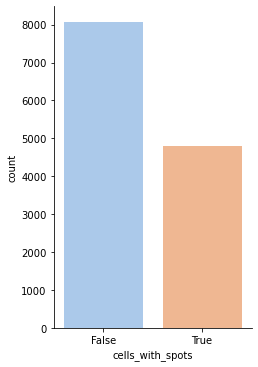

In [45]:
plt.figure(dpi=200)
sh = sns.catplot(data=cell_id, x="cells_with_spots", kind='count', palette="pastel", aspect=0.7)

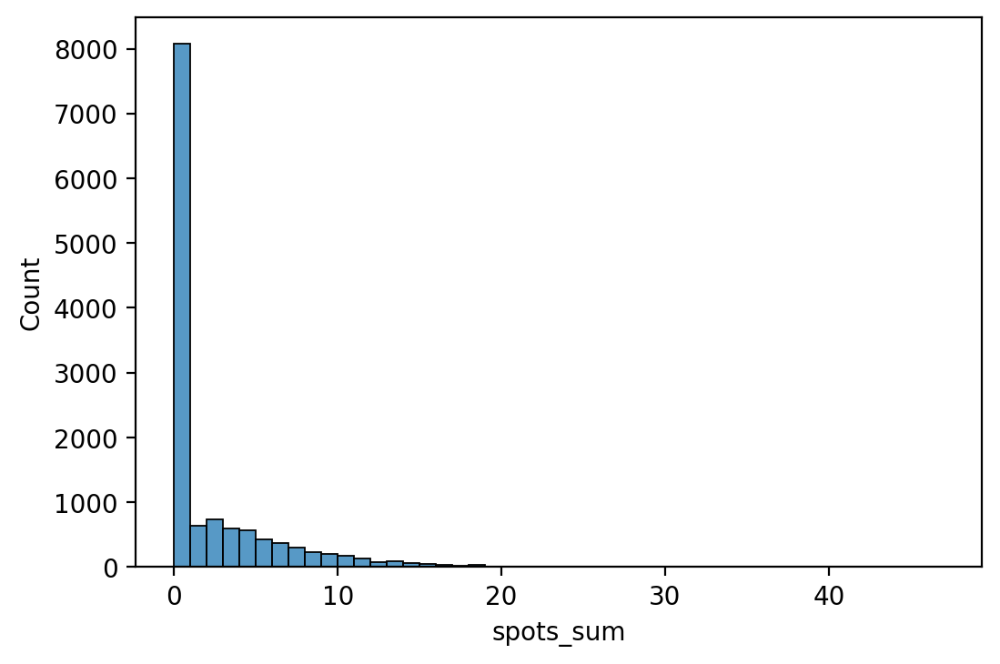

In [46]:
plt.figure(dpi=200)
sh = sns.histplot(cell_id, x="spots_sum", binwidth=1)

In [47]:
# plt.figure(dpi=100)
# sh = sns.histplot(data=cell_id, x="spots_sum", binwidth=1)

In [51]:
# cell_id.to_csv('./result/crisprmap20210928xenograft_reg.csv', index=False)

In [49]:
# high_quality = cell_id[cell_id['correlation_difference']>0.26]
# high_quality_mem = np.zeros(masks_mem.shape)
# for i in high_quality.index:
#     high_quality_mem[np.array(masks_mem)==i] = i
# plt.figure(dpi=250)
# plt.imshow(find_boundaries(high_quality_mem), origin='lower')

In [50]:
# high_quality = cell_id[cell_id['correlation_difference']>0]
# high_quality_mem = np.zeros(masks_mem.shape)
# for i in high_quality.index:
#     high_quality_mem[np.array(masks_mem)==i] = i
# plt.figure(dpi=250)
# plt.imshow(find_boundaries(high_quality_mem[up:down, left:right]), origin='lower', cmap='Greens')
# for i in range(Xthresh.shape[0]):
#     plt.imshow(Xthresh[i, 0], alpha=0.2, origin='lower', cmap="Reds")